# Outline of the Note Book:

## Step1: Importing libraries and cleaning the data :
* Test and train data was cleaned
## Step 2: EDA and feature selection:
* Train data was analysed  via visualis  and findings were extracted.
## Step 3: Feature Scaling and Feature Engineering:
* Features were encoded using hashing and Scaled using MinMax scalar
## Step 4: Model building and Evaluation :
* Logistic Regression and Random forest model was build and evalauted based on classification metric  and important feature was extracted.
## Step5:  Answering the asked questions
* prediction of test data for churn or no churn and finding the top hundred user fron test data that are more likely to churn. 
* files was saved in csv and excel format.




## Step1:   Importing required libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick # For specifying the axes tick format 
#Install datawig library,
import sqlite3


import category_encoders as ce
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import cohen_kappa_score
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss
from sklearn.model_selection import train_test_split
from sklearn import metrics

from sklearn.model_selection import cross_val_score,cross_val_predict, train_test_split
from sklearn.preprocessing import OneHotEncoder,StandardScaler,PowerTransformer,LabelEncoder
from sklearn.metrics import accuracy_score,classification_report, recall_score,confusion_matrix, roc_auc_score, precision_score, f1_score, roc_curve, auc, plot_confusion_matrix,plot_roc_curve
import lightgbm as lgb

#from lightgbm import LGBMClassifier, plot_importance
from yellowbrick.classifier import ClassificationReport
from yellowbrick.classifier import ConfusionMatrix
#importing plotly and cufflinks in offline mode

import plotly 
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import iplot
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import warnings
warnings.filterwarnings("ignore")

## Step1: Cleaning the Dataset

* Load the merged train and test file
* Remove the extra columns
* Checking missing values if any
* checking the data type of all the variables.


#### Load test and train data merged file and drop the unwanted features added while merging

In [2]:
# read the csv file to a dataframe
df= pd.read_csv("Merged_ContextUserTrain.csv") 
df_test =pd.read_csv("Merged_ContextUserTest.csv")
#Remove index and unamed col from testing  and train data
df1 = df.drop(['Unnamed: 0', 'index','level_0','Unnamed: 0.1'], axis = 1)
#df_test = df_test.drop(['Unnamed: 0', 'index'], axis = 1)
# to see all features of dataframe at one time
#pd.set_option('display.max_columns', None)
df_test =  df_test.drop(['Unnamed: 0', 'index','Unnamed: 0.1'], axis = 1)

#### Checking for any missing values in the dataset and information regarding the datatypes 

In [3]:
# function for checking the missing values  if any
def missing (df1):
    missing_number = df1.isnull().sum().sort_values(ascending=False)
    missing_percent = (df1.isnull().sum()/df1.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values
# calling the function
missing(df1)
missing(df_test)

,Missing_Number,Missing_Percent
Total_Additional_order_nperday,0,0.0
SiteViewsDays60_90,0,0.0
OpenRate30,0,0.0
CTR30,0,0.0
HouseHoldIncome,0,0.0
SiteSearchesDays60_90,0,0.0
SiteSearchesDays30_60,0,0.0
SiteSearchesDays0_30,0,0.0
SiteViewsDays30_60,0,0.0
Total_Additional_order_1perday,0,0.0


In [4]:
# checking the datatypes of all the column
df1.info()
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54129 entries, 0 to 54128
Data columns (total 35 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   State                           54129 non-null  object 
 1   GiftSubscription                54129 non-null  int64  
 2   CurrentGiftSubscription         54129 non-null  int64  
 3   SportsDigest                    54129 non-null  int64  
 4   FashionFiesta                   54129 non-null  int64  
 5   ScientificWeekly                54129 non-null  int64  
 6   SiteViewsDays0_30               54129 non-null  float64
 7   SiteViewsDays30_60              54129 non-null  float64
 8   SiteViewsDays60_90              54129 non-null  float64
 9   SiteSearchesDays0_30            54129 non-null  float64
 10  SiteSearchesDays30_60           54129 non-null  float64
 11  SiteSearchesDays60_90           54129 non-null  float64
 12  HouseHoldIncome                 

* Neither duplicated nor Missing value found in the dataset
* Test dataset has only 33 features as churned in 90 days need to be filled by the model.

#### Converting the Subscription created at column to Date column and removing the time from te time stamp

In [5]:
#converting the timestamp to date for train
df1['SubscriptionCreatedAt'] = df1['SubscriptionCreatedAt'].apply(lambda x : pd.to_datetime(str(x)))
df1['Dates'] = df1['SubscriptionCreatedAt'].dt.date
#df1['year'] = pd.DatetimeIndex(df1['Dates']).year
#df1['month'] = pd.DatetimeIndex(df1['Dates']).month
df2 = df1.rename(columns={'Dates': "Sub_createdat"})
df2 = df2.drop("SubscriptionCreatedAt",axis =1)

df2.info()

#converting the timestamp to date for test

df_test['SubscriptionCreatedAt'] = df_test['SubscriptionCreatedAt'].apply(lambda x : pd.to_datetime(str(x)))
df_test['Dates'] = df_test['SubscriptionCreatedAt'].dt.date
#df1['year'] = pd.DatetimeIndex(df1['Dates']).year
#df1['month'] = pd.DatetimeIndex(df1['Dates']).month
df_test1 = df_test.rename(columns={'Dates': "Sub_createdat"})
df_test2 =df_test1.drop("SubscriptionCreatedAt",axis =1)

#df_test2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54129 entries, 0 to 54128
Data columns (total 35 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   State                           54129 non-null  object 
 1   GiftSubscription                54129 non-null  int64  
 2   CurrentGiftSubscription         54129 non-null  int64  
 3   SportsDigest                    54129 non-null  int64  
 4   FashionFiesta                   54129 non-null  int64  
 5   ScientificWeekly                54129 non-null  int64  
 6   SiteViewsDays0_30               54129 non-null  float64
 7   SiteViewsDays30_60              54129 non-null  float64
 8   SiteViewsDays60_90              54129 non-null  float64
 9   SiteSearchesDays0_30            54129 non-null  float64
 10  SiteSearchesDays30_60           54129 non-null  float64
 11  SiteSearchesDays60_90           54129 non-null  float64
 12  HouseHoldIncome                 

##  Step 2 :  Exploratory Analysis and Feature Selection 

* Data Exploration
* Look at the cardinality of the variables of train data.
* * Check the percentage of user churn in 90 days from the context catalog train dataset.
* * Check for any multicollinerity of numerical features from the train dataset.
* * Drop one of each highly correleated column pairs and check again if any  multicollinerity still persist.
* * Look for churn percentage per state and the plot them
* * Find the churn rate per state and plot.
* * Find and plot the churn rate  with all the categorical variable to see how it variate with the churn rate.

*  Drop the subscriptioncreatedat,AreaCode, UserId column from the dataset as the data is already aggregated on the bases of months and userid is the unique identifier.
* copy raw test data into another dataframe and drop areacode, userid , subscription createdat from test data.


### checking the churn percentage 

In [6]:
# check percent of user churn
y = df2['ChurnedIn90Days']
print(f'Percentage of Churn:  {round(y.value_counts(normalize=True)[1]*100,2)} %  --> ({y.value_counts()[1]} Users)')
print(f'Percentage Non_Churn: {round(y.value_counts(normalize=True)[0]*100,2)}  %  --> ({y.value_counts()[0]} users)')

Percentage of Churn:  50.26 %  --> (27204 Users)
Percentage Non_Churn: 49.74  %  --> (26925 users)


Text(0.5, 1.0, '# of Customers by churnedin90 days')

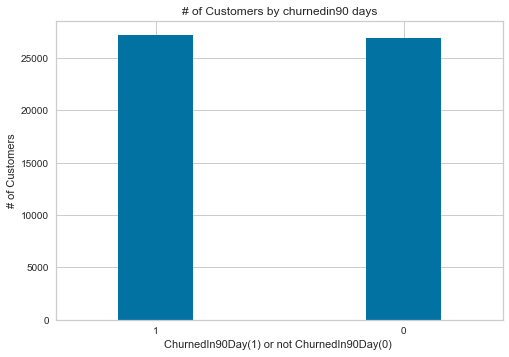

In [42]:
ax = df2['ChurnedIn90Days'].value_counts().plot(kind = 'bar',rot = 0, width = 0.3)
ax.set_ylabel('# of Customers')
ax.set_xlabel('ChurnedIn90Day(1) or not ChurnedIn90Day(0) ')
ax.set_title('# of Customers by churnedin90 days')

In [7]:
# extracting numerical and categorical features
numerical= df2.select_dtypes(include = 'float64').columns
categorical = df2.select_dtypes(include = ['object','int64']).columns

print(f'Numerical Columns:  {df2[numerical].columns}')
print('\n')
print(f'Categorical Columns: {df2[categorical].columns}')

Numerical Columns:  Index(['SiteViewsDays0_30', 'SiteViewsDays30_60', 'SiteViewsDays60_90',
       'SiteSearchesDays0_30', 'SiteSearchesDays30_60',
       'SiteSearchesDays60_90', 'HouseHoldIncome', 'CTR30', 'OpenRate30',
       'RejectRate30', 'CTR30_60', 'OpenRate30_60', 'RejectRate30_60',
       'CTR60_90', 'OpenRate60_90', 'RejectRate60_90', 'Age',
       'Total_No._order_90days', 'Total_order_value', 'Item_value_90days',
       'Total_no._Item_90days', 'Total_promotion_90days',
       'Total_Additional_order_1perday', 'Total_Additional_order_nperday'],
      dtype='object')


Categorical Columns: Index(['State', 'GiftSubscription', 'CurrentGiftSubscription', 'SportsDigest',
       'FashionFiesta', 'ScientificWeekly', 'Areacode', 'Ratings0_90',
       'UserId', 'ChurnedIn90Days', 'Sub_createdat'],
      dtype='object')


### Corelation heap map of numerical variable

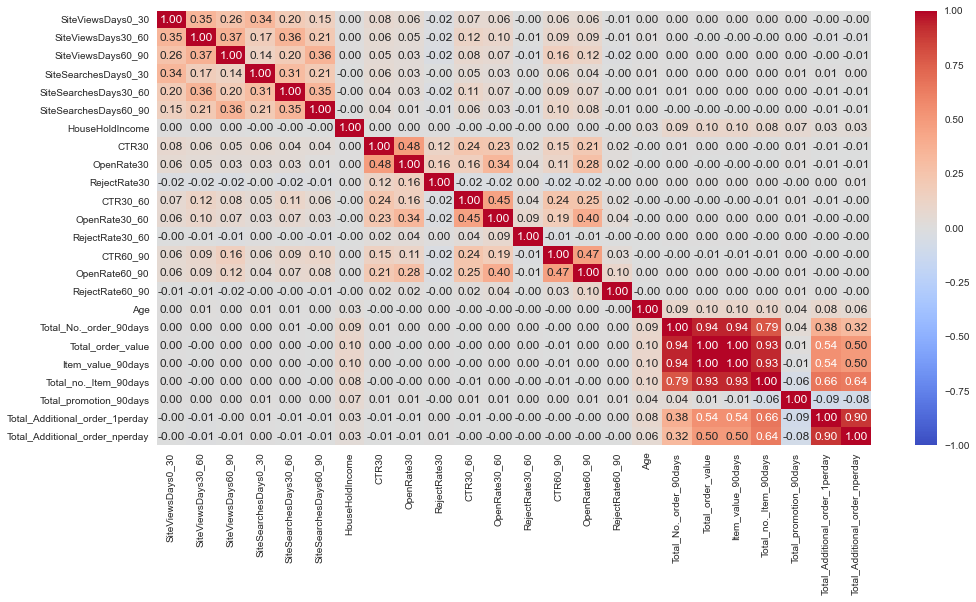

In [8]:
# Heat map to see the corelation among the numerical feature and see if any multi colinearity exiat in the data
plt.figure(figsize=(16, 8))
sns.heatmap (df2[numerical].corr(), annot=True, fmt= '.2f', vmin=-1, vmax=1, center=0, cmap='coolwarm');

#### Drop the columns that have high multicolinearity

In [9]:
# drop one of the  multicollinerity  columns from train
drop_col = ['Item_value_90days','Total_Additional_order_nperday','Total_no._Item_90days','Total_order_value']
df3 = df2.drop(drop_col, axis=1)
# check size of dataset


# drop one of the  multicollinerity  columns from test
df_test3 = df_test2.drop(drop_col, axis=1)
#df_test3.shape
df3.shape

(54129, 31)

In [10]:
# selecting the new numerical columns 
numerical= df3.select_dtypes(include = 'float64').columns
numerical


Index(['SiteViewsDays0_30', 'SiteViewsDays30_60', 'SiteViewsDays60_90',
       'SiteSearchesDays0_30', 'SiteSearchesDays30_60',
       'SiteSearchesDays60_90', 'HouseHoldIncome', 'CTR30', 'OpenRate30',
       'RejectRate30', 'CTR30_60', 'OpenRate30_60', 'RejectRate30_60',
       'CTR60_90', 'OpenRate60_90', 'RejectRate60_90', 'Age',
       'Total_No._order_90days', 'Total_promotion_90days',
       'Total_Additional_order_1perday'],
      dtype='object')

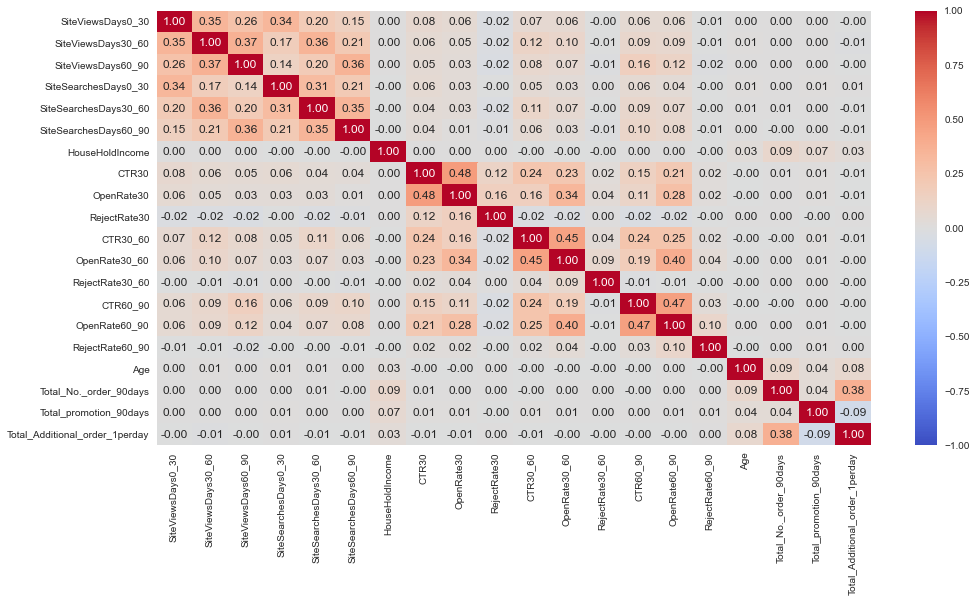

In [11]:
# check again for multi  multicollinerity 
plt.figure(figsize=(16, 8))
sns.heatmap (df3[numerical].corr(), annot=True, fmt= '.2f', vmin=-1, vmax=1, center=0, cmap='coolwarm');


In [12]:
# checking number of unique values in the categorical dataset
df3[categorical].nunique()



State                         73
GiftSubscription               2
CurrentGiftSubscription        2
SportsDigest                   2
FashionFiesta                  2
ScientificWeekly               2
Areacode                   16248
Ratings0_90                    6
UserId                     54129
ChurnedIn90Days                2
Sub_createdat                535
dtype: int64

In [13]:
# finding the churn percentage per state
#for i in df3["State"].unique():
    #print(f'A customer from state of {i} has a probability of {round(df3[df3["State"]==i]["ChurnedIn90Days"].mean()*100,2)} % churn.')

#### Finding Churnrate and churnIn90 days per state

In [14]:
# plot the churn per state
fig = px.histogram(data_frame=df3, x="State", color="ChurnedIn90Days", width=1200, height=400)
fig.show()


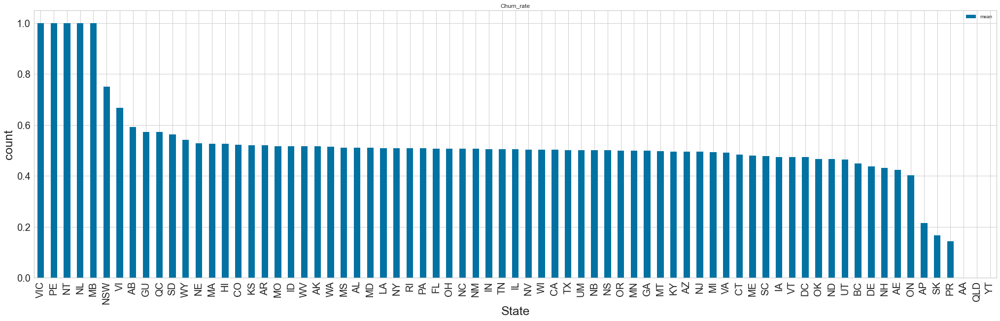

In [15]:
# function to find and visualize the churn rate by state  and sort the value in ascending order
#(Mean is used to divide the number ofchurn per state/total churn perstate )
def Churn_rate(x,y,data):

    data.groupby([x])[y].agg([np.mean]).sort_values(by='mean', ascending=False).plot(kind='bar',figsize=(35,10))
   
    plt.xlabel(x,fontsize= 25)
    plt.ylabel('count',fontsize= 25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.title("Churn_rate")
    plt.show()
Churn_rate('State','ChurnedIn90Days',df3)


In [16]:
# Function to plot churn rates by another categorical variable
def compare_plot(df_user,col):
    xtab = df_user[['UserId','ChurnedIn90Days',col]]
    xtab = xtab.groupby([col,'ChurnedIn90Days']).count().reset_index()
    xtab = pd.crosstab(xtab[col], xtab['ChurnedIn90Days'], xtab.UserId, aggfunc='sum', normalize = 'index')
    xtab.plot.bar(stacked=True)
    plt.xticks(rotation=360)
    plt.legend(bbox_to_anchor=(1, 1.05), title = 'Churn')
    plt.title('Churn % by ' + str(col))
    print(xtab)
    plt.show()

ChurnedIn90Days         0         1
Ratings0_90                        
0                0.497509  0.502491
1                0.494301  0.505699
2                0.498795  0.501205
3                0.537634  0.462366
4                0.250000  0.750000
6                1.000000  0.000000


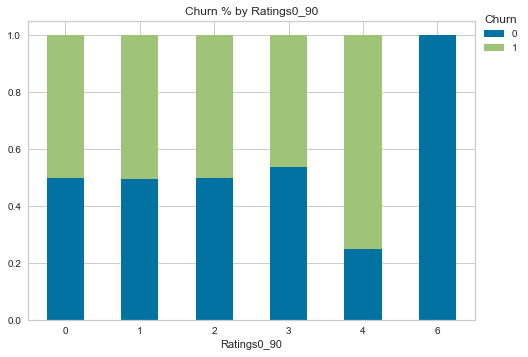

ChurnedIn90Days          0         1
GiftSubscription                    
0                 0.491069  0.508931
1                 0.530735  0.469265


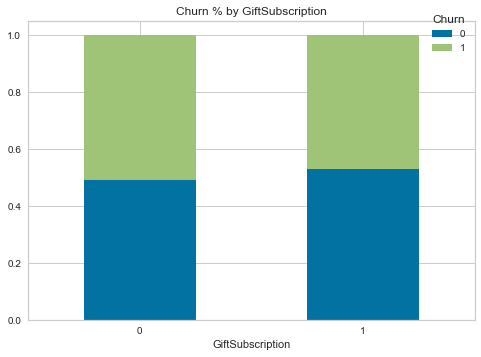

ChurnedIn90Days                 0         1
CurrentGiftSubscription                    
0                        0.490121  0.509879
1                        0.542709  0.457291


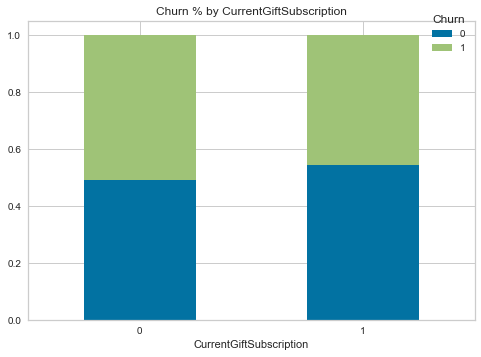

In [17]:
# Call the fucntion to see,  categorical variable distribution  with churn rate 


compare_plot(df3, 'Ratings0_90')
compare_plot(df3, 'GiftSubscription')
compare_plot(df3, 'CurrentGiftSubscription')


ChurnedIn90Days         0         1
FashionFiesta                      
0                0.499111  0.500889
1                0.495352  0.504648


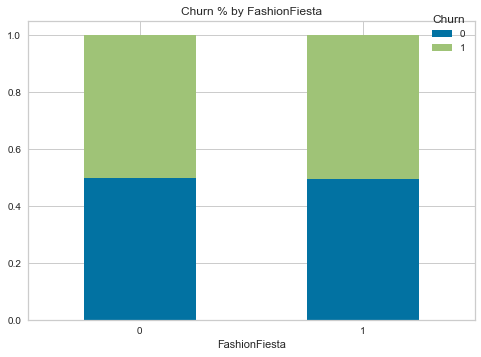

ChurnedIn90Days          0         1
ScientificWeekly                    
0                 0.499658  0.500342
1                 0.495305  0.504695


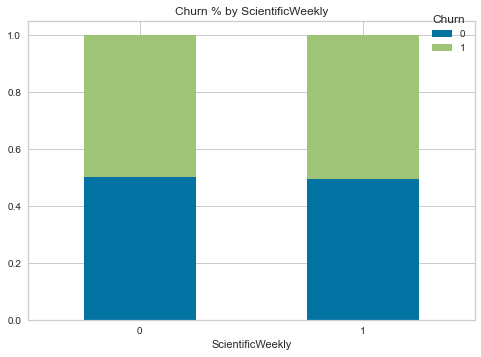

ChurnedIn90Days         0         1
SportsDigest                       
0                0.488414  0.511586
1                0.505953  0.494047


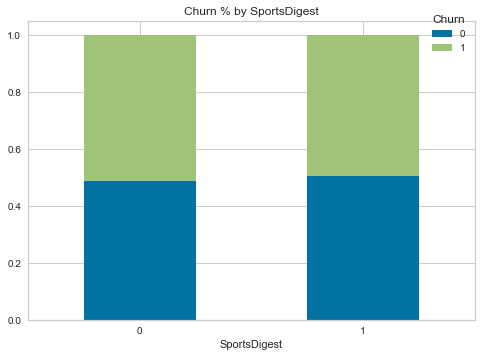

In [18]:
# Call the fucntion to see,  categorical variable distribution  with churn rate compare_plot(df2, 'SportsDigest')
compare_plot(df3, 'FashionFiesta')
compare_plot(df3, 'ScientificWeekly')
compare_plot(df3, 'SportsDigest')

In [19]:
Giftuser =df3["GiftSubscription"].value_counts()
print("Number of user with and without giftsunscription ",  Giftuser )
currentGiftuser =df3["CurrentGiftSubscription"].value_counts()
print("Number of user with and without currentgiftsunscription ",  currentGiftuser )

Number of user with and without giftsunscription  0    45458
1     8671
Name: GiftSubscription, dtype: int64
Number of user with and without currentgiftsunscription  0    46613
1     7516
Name: CurrentGiftSubscription, dtype: int64


Text(0.5, 1.0, '# of Customers by Subscription Type')

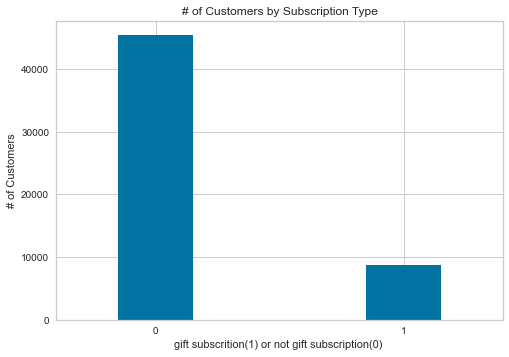

In [20]:
# distribution of gift subscriber an non gift subscriber
ax = df3['GiftSubscription'].value_counts().plot(kind = 'bar',rot = 0, width = 0.3)
ax.set_ylabel('# of Customers')
ax.set_xlabel('gift subscrition(1) or not gift subscription(0) ')
ax.set_title('# of Customers by Subscription Type')


###  Findings Step2:

* 50.26% of users in Context catalog were churned (unsubscribe), Looking at the churn distribution,context catalog growth rate is decreasing as percentage of churned users as comapared to non churned users is high. Out of total of 54129 user 27204 Users were churned.

### Reason: 
    * Accordng to the plots, customer  who started without gift subscription seems to churn more as comapred to customer who started from gift subscription and there are total  45458 user who started without gift subscription and 8671 users who started intially with gift subscription.

    * Customer who's gift subscription is not current, are chruning more, which make sense because they are the gift subscriber and their gift subscrition coming to end. Context catalog must focus on  user who started without the gift subscrition because the customer who started with gift subscription are the cold customer  and not the lead(core) customer, we need to focus on the lead(core) customer, who started the subscription because of intrest and liking on the product of context catalog.

    * to futher analyse the things we will drop the currentgiftsubscription column and focus on the reason behind the lead user churning from context catalog.

##### This means the context catalog is loosing its core customer

* customer with sports subscription churn approx. 1%less as comapred to the customer with other subscription.

* Item_value_90days','Total_Additional_order_nperday','Total_no._Item_90days','Total_order_value variables could be removed from the train data , as they were showing high multicollinearty and adding them will not add any useful information.

* Context catalog with in United States have highest churn rate  in South Dakota and  lowest churn rate in New Hampshire. Also Max number of user of context catalog are from California, Texas,Florida, New york and very few from South Dakota, Delaware and New Hampshire 
* Questions:
* * * Does lower  salary increase churn?
* * * user of fashion fiesta , sports ,science per state?
* * * churn rate for gift sub , current sub?
* * *
* We find the relationship of user churn and income per state to understand the reason of churn in particuar state.It was found that south dakota has low income as compared to the New Hamsphire.


<AxesSubplot:xlabel='HouseHoldIncome', ylabel='Density'>

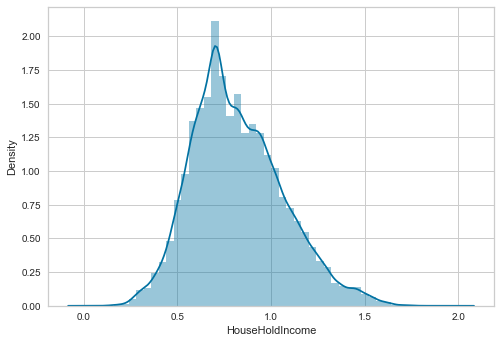

In [21]:
#household income distribution
sns.distplot(df3["HouseHoldIncome"])

<AxesSubplot:>

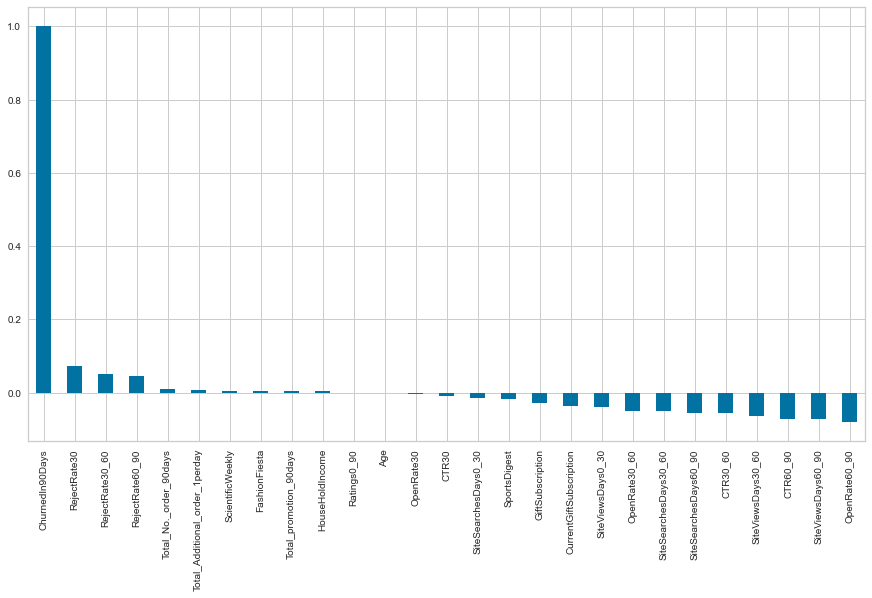

In [22]:
#Get Correlation of "Churn" with other variables:
plt.figure(figsize=(15,8))
df3.corr()['ChurnedIn90Days'].sort_values(ascending = False).plot(kind='bar')



### Findings from the visuals of corelation with the churnin90days.

* Rejectrate30,Total number of order and total additional order seem to be positively correlated with churnin 90days. While, openrate60-90,CTR60-90 and siteview 60-90 days, seem to be negatively correlated with churnin90days.

* Interestingly, services such as fashion and scientificweekly seem to be positively  and sports diget seems to be negatively related to churnin90days.

* Corelation don't imply the causation so we will explore the patterns for the above correlations below before we delve into modelling and identifying the important variables.
 
* Age and rating has no correlation with the churnin 90days , this could be because there are lot of zero records in the rating variable and mean imputation in the Age.


# Relationships and pattern in data

#### Relatonship between the total number of orderin 90 days and total_promotion_90days

In [23]:
# interactive plot to show the relation between the total no. of orders and total promotions per user
fig = px.scatter(df3, x ="Total_No._order_90days", y="Total_promotion_90days",title= "Total number of orders and total promotions ")
fig.show()



#### Findings :
* Most of the users have total number of orders in range 0-25.
* Context Catalog need to rethink on its promotions policies , as can be seen from the plot there were times when user with order count 20 have given the promotion of 192 dollars where as there were user who have the same order count but given the promotion of only 28 dollars. Also user with highest number of order (72)had given promotion of only 94 dollars.
* Context catalog is not providing promotions based on the order values of the users or they are giving random promotions.

* We can see later using Ml model if promotions has any impact on the user churning

### Relationship between total promotions and total additional orders 1 per day for 90 days per user 

In [24]:
fig = px.scatter(df3, x='Total_promotion_90days', y='Total_Additional_order_1perday',title = "Total no. of promotion impact on no. of additional order")
fig.show()

#### Findings :

* There were many users who were given promotion in range 0-50 and have high number of additional order and also there are users who were given the highest promotion but additionalorder count was low.

* or we can say that context catalog users, with low promotions have high additional number of orders or they are buying small orders rather than buying higher package for higher subscription charge. 

* This lead us to check the household income of the users.

## Total house hold income and Additional orders

In [25]:
fig = px.scatter(df3, x="HouseHoldIncome", y="Total_Additional_order_1perday",
                title="Total house hold income and number of additional orders ")
fig.show()

#### Findings:

* User with low income has less additional order
* User in  low - medium income range has highest amount of additional orders
* User in medium to higher income range has less number of additional orders
* Context Catalog lead users are medium income range and can provide better promotional offers to these range of * * users rather than focusing on the higher income range users.



In [26]:
fig = px.scatter(df3, x="HouseHoldIncome", y="Total_No._order_90days",
                title="Total house hold income and number of orders ")
fig.show()

#### Findings :
* Context catalog have higher range of  Medium income users

In [27]:
drop_column = ["Areacode","UserId","Ratings0_90","Sub_createdat"]
df4= df3.drop(drop_column, axis=1)
df_test4 = df_test3.copy()
df_test5 = df_test4.drop(drop_column,axis = 1)



## Step 3: Feature Engineering
As Ml model need all categorical data in int form. So will encode the data.

* Split the data into independent(feature) and target variable.
* hasing encoding of State for test and train data.
* Split the data into test and validation.

Note: We are considering Age as numerical variable rather than categorical so no need to encode Age.


In [28]:
# Split data into dependent and independent variables
X = df4.drop('ChurnedIn90Days',axis=1)# drop the target column and add axis to it to make it two dim.
y = df4['ChurnedIn90Days'].values# take the target col values and assign to y


In [29]:
# encoding State feature using dummy encoding could generate lot of features as State has 72 unique values , 
# This may lead to dimenionality curse problem that arises with the increase in number of dimensions so I will be using 
#hasing to encode the State. Basically there are 72 states so hasing will encode the states with seven column with each column
# pattern indiacting one state.Ths is like OneHot but fewer dimensions.

#X_dum = pd.get_dummies(X)
#df_test_dummies = pd.get_dummies(df_test3)

#Encoding the state feature using hashing
ce_hashing = ce.HashingEncoder(cols='State')
df5 = ce_hashing.fit_transform(X)
df_test_dummies = ce_hashing.fit_transform(df_test5)# need to transform the test data file 
df_test_dummies
#df_test = ce_hashing.transform(df_test)
#df_test_dummies

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,GiftSubscription,CurrentGiftSubscription,...,CTR30_60,OpenRate30_60,RejectRate30_60,CTR60_90,OpenRate60_90,RejectRate60_90,Age,Total_No._order_90days,Total_promotion_90days,Total_Additional_order_1perday
0,0,0,0,0,0,0,0,1,0,0,...,0.685903,0.503703,0.489418,0.811964,0.390893,0.441288,33.0,2.0,0.0,1.0
1,0,1,0,0,0,0,0,0,0,0,...,0.679687,0.534714,0.587728,0.282338,0.475452,0.776881,33.0,4.0,-7.0,2.0
2,0,0,0,0,1,0,0,0,0,0,...,0.296195,0.617659,0.628649,0.297704,0.671474,0.822081,33.0,7.0,0.0,0.0
3,0,0,0,0,0,0,0,1,0,0,...,0.408954,0.203825,0.569092,0.453655,0.524063,0.809750,33.0,1.0,-10.0,0.0
4,0,0,0,0,0,1,0,0,1,1,...,0.822929,0.826312,0.370646,0.906763,0.776978,0.724766,33.0,4.0,-9.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26657,0,0,0,0,0,0,1,0,0,0,...,0.616363,0.531360,0.330601,0.363746,0.564589,0.709362,24.0,4.0,-7.0,1.0
26658,0,1,0,0,0,0,0,0,0,0,...,0.350869,0.345839,0.535385,0.469015,0.367884,0.876568,38.0,9.0,0.0,2.0
26659,0,1,0,0,0,0,0,0,0,0,...,0.713570,0.747169,0.102069,0.276241,0.424058,0.333621,25.0,0.0,0.0,0.0
26660,0,0,1,0,0,0,0,0,0,0,...,0.490729,0.303120,0.730560,0.730394,0.584616,0.840823,29.0,4.0,-5.0,0.0


In [30]:
# spliting test and train data
X_train, X_test, y_train, y_test = train_test_split(df5, y, test_size = .25, random_state = 33)




# Step 3: Feature Scaling
* Min Max scaler will be used to standardize the data into same sacle.

Note: To avoid data lekage, data was splitted first and then scaled.(other wise baised prediction possibility.

In [31]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train_scale = pd.DataFrame(scaler.fit_transform(X_train), columns = X_train.columns)
X_test_scale = pd.DataFrame(scaler.transform(X_test), columns = X_test.columns)
df_test_scale = pd.DataFrame(scaler.transform(df_test_dummies), columns = df_test_dummies.columns)



## Step 4 : Model1 and its Evaluation
###  state hash encoded
* Apply logistic regression model.
* Classification report.
* Finding important features and getting insights.
* fit model on ContextUsrTest_merged data
* Getting predicted value with the UserId
* Applying random forest

In [32]:
LR = LogisticRegression(C=0.01, solver='liblinear').fit(X_train_scale, y_train)
y_test_pred = LR.predict(X_test_scale)
y_hat_train = LR.predict(X_train_scale)

# Accuracy
lr_accuracy = accuracy_score(y_test, y_test_pred)
#svc_f1_score = f1_score(y_val, y_pred)
#print('SupportVector - accuracy score: {} and f1_score: {}'.format(svc_accuracy, svc_f1_score))
lr_accuracy


0.5603339983743442

## Step 4 : Logistic regression classification report

In [33]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, cohen_kappa_score
#precision,F-score,recall for each class
print(classification_report(y_test , y_test_pred))


              precision    recall  f1-score   support

           0       0.55      0.56      0.56      6691
           1       0.57      0.56      0.56      6842

    accuracy                           0.56     13533
   macro avg       0.56      0.56      0.56     13533
weighted avg       0.56      0.56      0.56     13533



## Step 4 : Confusion matrix

In [34]:
cm = metrics.confusion_matrix(y_test , y_test_pred)
print(cm)

[[3752 2939]
 [3011 3831]]


In [35]:
# finds the feature coef, but logistic regression, function is logit so it make more sense to find odds
importance = LR.coef_[0]
#dfimp = pd.DataFrame(importance, X.columns, columns=['coef']).sort_values(by='coef', ascending=False)
#dfimp
odds = np.exp(LR.coef_[0])
df_odds = pd.DataFrame(odds, X_train_scale.columns, columns=['odds']).sort_values(by='odds', ascending=False)
df_odds


,odds
RejectRate30,1.623852
RejectRate30_60,1.483285
RejectRate60_90,1.417394
Total_promotion_90days,1.200197
SiteSearchesDays0_30,1.100898
Total_No._order_90days,1.086815
col_0,1.058473
col_3,1.058416
col_2,1.056906
Total_Additional_order_1perday,1.041174


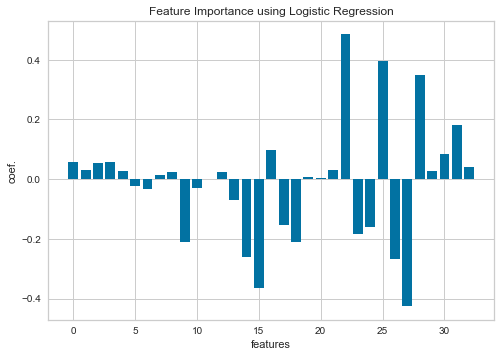

In [36]:
plt.bar([x for x in range(len(importance))], importance)
plt.title("Feature Importance using Logistic Regression")
plt.xlabel("features")
plt.ylabel("coef.")
plt.show()

### Findings:
* FEATURE IMPORTANCE:
* RejectRate30	
* OpenRate60_90	
* SiteViewsDays60_90
* CTR60_90	
* Total_promotion_90days


* An increase in 1 standard deviation in reject_rate_30 is associated with 62 percent increase in the Odds of churn.(proper marketing strategies must be made before sending emails to the user, rather than shooting the mail one after another,  if context catalog have recorded the intrests data of each customer,and targeted the email to the customer specific need it would have lead to better insights .As it is better to  send proper quality email rather than quanity.)


* An increase in 1 standard deviation in Total_promotion_90days is associated with 21 percent increase in the Odds of churn.(company) . To get better insights it would be good to have a data related with the Type of promotion (Free subscription for 1 month, discount in the order value etc. Also the insght to be taken for  here is the company is providing promotions randomly ( right users are not getting better promotions.)

* To better understand there churned customer type( cold customer was churned or the new customer was churned who was just trying the free subscription]). leaving new customer is less imapctful than old customer.To get better insights company should maintain the tenure of each customer/user.

* An increase in 1 standard deviation in Total_Additional_order_1perday is associated with 4 percent increase in the Odds of churn.(Although this is not so prominent feature).

* SiteSearchesDays0_30: An increase in 1 standard deviation in SiteSearchesDays0_30 is associated with 10 percent increase in the Odds of churn.(Interface of the website must be looked again, must be made user freindly, complex ordering interface could be the reason of churn)

* An increase in 1 standard deviation in Total_No._order_90days is associated with 8 percent increase in the Odds of churn.	company should overlook on its payment gateways.

* An increase in 1 standard deviation in Total_Additional_order_nperday is associated with 3 percent increase in the Odds of churn.

* An increase in 1 standard deviation in openRate 60_90 is associated with 35 percent decrease in the Odds of churn.it means that context catalog have intrested auidence

* An increase in 1 standard deviation in SiteViewsDays60_90 is associated with 31% percent decrease in the Odds of churn.

* An increase in 1 standard deviation in CTR60_90  is associated with 24% percent  decrease in the Odds of churn.

* CurrentGiftSubscription is associated with a 20% (1 – 0.86 = 0.14) reduction in the relative risk of churn.

* The SportsDigest package  is associated with a  3% (1- 0.970249 = 0.03) reduction in the relative risk of churn.



Hence we can say that: number of mail rejected in 0-30 days rate is the most prominent factor in finding the Churn of the user and openrate 60-90 days reduces the chance of churn
When user have clicked the email, it was found that there was relatively less churn. User with current gift subscription tend to have low churn (we get to know the type user ). user of SportsDigest package have less churn compare to other two. fashion fiesta and scientific book magzine content need to be focused.
experenice of user in accessing the website could be the reason of churn.

* 

Note: (Odds = probability of churn/prob. of no churn)
https://quantifyinghealth.com/interpret-logistic-regression-coefficients/

## Step 4 : MODEL2: RANDOM FOREST CLASSIFIER 
* find feature importance

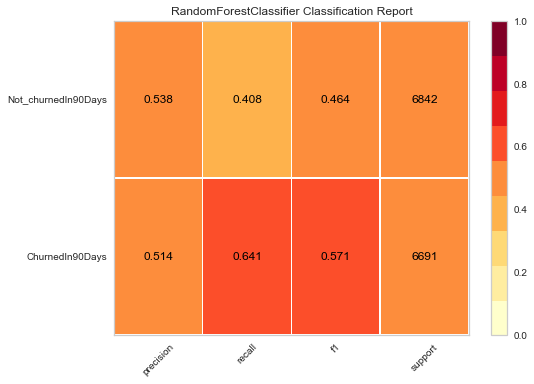

In [37]:
model = RandomForestClassifier(n_estimators=10, random_state=1)
vizualizer = ClassificationReport(model, classes=['ChurnedIn90Days', 'Not_churnedIn90Days'], support=True)
vizualizer.fit(X_train_scale, y_train)
vizualizer.score(X_test_scale, y_test)
vizualizer.show();

#### Interpretation:

* Precision for not  Churn:
Precision for churn: Out of all the prediction of user who were churned by the model , 51.4 were actually churned 
Recall for churn: Out Of all the user that were  labeled churn intially  ,  64 percent were labeled correct

* Formula for Precision: True Positive/(True Positive + False Positive)
* The correct positive predictions that model made out of total number of positive predictions
* Recall : True Positive /(True Positive +False negative)
* Recall calculates the ratio of predicted positives to the total number of positive labels.

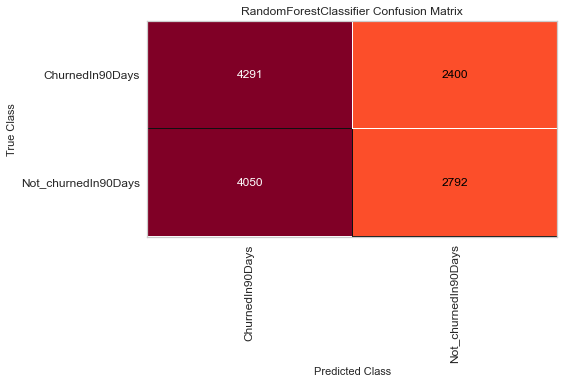

In [38]:

# Instantiate model and visualizer
model = RandomForestClassifier(n_estimators=10, random_state=1)
matrix = ConfusionMatrix(model, classes=['ChurnedIn90Days', 'Not_churnedIn90Days'])
# Fit, score, and display the visualizer
matrix.fit(X_train_scale, y_train)
matrix.score(X_test_scale, y_test)
matrix.show();


## Step 4 : Feature importance in random forest

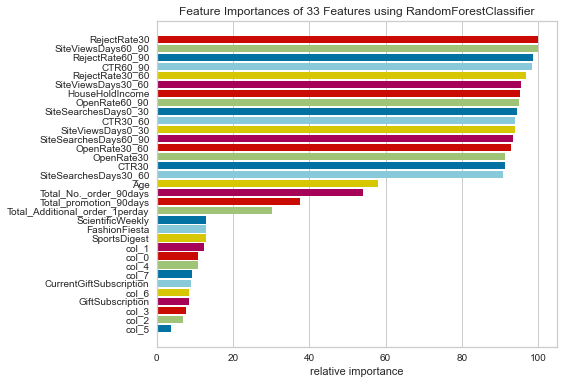

<AxesSubplot:title={'center':'Feature Importances of 33 Features using RandomForestClassifier'}, xlabel='relative importance'>

In [39]:
# random forest classifier Yellowbricks
from sklearn.ensemble import RandomForestClassifier
from yellowbrick.model_selection import FeatureImportances

# Load the classification data set
#X = df4.drop('ChurnedIn90Days',axis=1)# drop the target column and add axis to it to make it two dim.
#y = df4['ChurnedIn90Days'].values# take the target col values and assign to y

model = RandomForestClassifier(n_estimators=10)
viz = FeatureImportances(model)
viz.fit(X_train_scale, y_train)
viz.show()


## Step 5:  Answering the Questions

#### Finding predinction on test data and saving the results.

In [40]:
y_df_test_pred = LR.predict(df_test_scale)

# to add prediction result back
y_hats2 = LR.predict(df_test_scale)# running model on raw test data
df_test[['Prediction']] = y_hats2
df_predictedlabel = df_test[['UserId', 'Prediction']]# take 2 colmn from dataframe and create new data frame
df_predictedlabel.to_csv("Predictions.csv",header = True)
df_predictedlabel.to_excel("Predictions.xlsx",header = True)


#### Finding top 100 User that have high probability of churn from test data and saving the results 

In [41]:
y_hats3 = LR.predict_proba(df_test_scale)[:,1]# running model on raw test data to predict probability of churning
df_test['Prob_churn'] = y_hats3
#df_test[['UserId', 'Prob']].head(100)
df_highchurnprob = df_test[['UserId', 'Prob_churn']].sort_values(["Prob_churn"], ascending=False).head(100)# find all the prob of churning sort in descending order and save to dataframe
df_highchurnprob.to_csv("users.csv",header = True)# dataframe that have all the user with high probability of churning.
df_highchurnprob.to_excel("users.xlsx")

https://quantifyinghealth.com/interpret-logistic-regression-intercept/